Challenge Set 8  
Topic:        Visualizing Trees  
Date:         08/08/2016  
Name:         Avi Grunwald  
Worked with:  

**Challenge 1**

In [30]:
import pandas as pd
import numpy as np
from sklearn.cross_validation import train_test_split
from sklearn.preprocessing import scale
from patsy import dmatrices

In [19]:
house = pd.read_csv('/home/avi/Documents/metis/Projects/Challenges/house-votes-84.data', header=None)
house.replace(['y', 'n', '?'], [1, 0, np.nan], inplace=True)

In [20]:
means = [ house[x].mean() for x in house if x!=0 ]
means_vote = [ round(house[x].mean()) for x in house if x!=0 ]
for x in range(1, len(house.columns)):
    house[x] = house[x].replace(np.nan, means_vote[x-1])

In [21]:
house.columns = ['Vote {}'.format(x) if x != 0 else 'Party' for x in house.columns ]

In [8]:
parties = house[0].replace(['republican', 'democrat'], [0, 1])

X = house.iloc[:,1:]
y = parties

X_scale = scale(X)

x_train, x_test, y_train, y_test = train_test_split(X_scale, y, test_size=.30, random_state=4444)

In [9]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
dtc.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

Visualizing the Tree

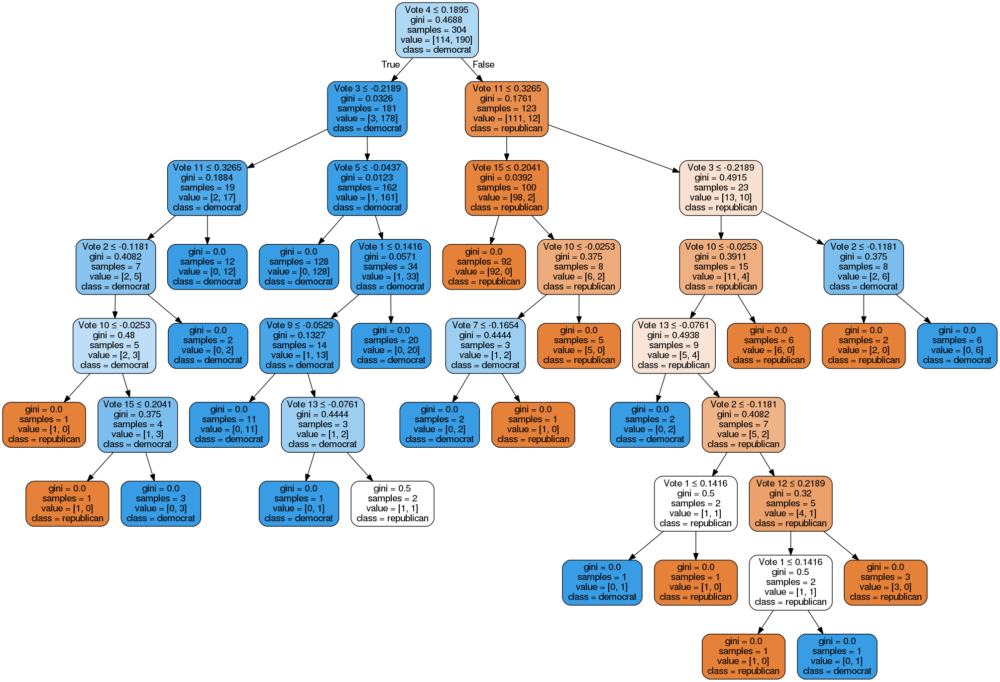

In [29]:
from sklearn.externals.six import StringIO
import pydotplus
from IPython.display import Image
from sklearn.tree import export_graphviz

dot_data = StringIO()  
export_graphviz(dtc, out_file=dot_data,  
                         feature_names=house.columns[1:],  
                         class_names=['republican', 'democrat'],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

**Challenge 2**

In [32]:
from datetime import datetime

data_start = pd.read_csv('movies_list_all_df.csv', index_col=0)
movie_data = pd.read_csv('2013_movies.csv')
                        
data_start['rdm'] = data_start['Release Date'].apply(lambda x: datetime.strptime(x, '%B %d, %Y').strftime('%B'))
data_start['rdy'] = data_start['Release Date'].apply(lambda x: datetime.strptime(x, '%B %d, %Y').strftime('%Y'))
data_start['Release Date'] = data_start['Release Date'].apply(lambda x: datetime.strptime(x, '%B %d, %Y'))
# data_start['rd'] = pd.to_datetime(data_start.rd)

data_start['Domestic Total Gross'] = data_start['Domestic Total Gross'].apply(lambda x: int(''.join([i for i in x if i.isnumeric()])))
data_start['Opening Weekend Gross'] = data_start['Opening Weekend Gross'].apply(lambda x: int(''.join([i for i in x if i.isnumeric()])))

data_start['Runtime'].fillna(value='0 hrs. 0 min.', inplace=True)
data_start['Runtime'] = data_start['Runtime'].str.replace(' min.', '').str.split(' hrs. ').apply(lambda x: int(x[0]) * 60 + int(x[1]))
data_start = data_start[data_start['Runtime']!=0]
                         
data_start.columns = [ 'title', 'dtg', 'dist', 'rd', 'run', 'rating', 'pb', 'owg', 'owt', 'act', 'series', 'rdm', 'rdy']

In [99]:
y, X = dmatrices('series ~ dtg + run + rating + owg + act + rdm + rdy', data=data_start, return_type='dataframe')
x_train, x_test, y_train, y_test = train_test_split(X, y['series[Yes]'], test_size=.30, random_state=4444)

In [34]:
dtc_movies = DecisionTreeClassifier()
dtc_movies.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

In [100]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test, dtc_movies.predict(x_test))

0.83273766976411723

In [101]:
dot_data = StringIO()  
export_graphviz(dtc_movies, out_file=dot_data,  
                    feature_names=X.columns,  
#                    class_names=True,
                    class_names=['No', 'Yes'],                
                    filled=True, rounded=True,  
#                    proportion=True,
#                     node_ids=True,
                    special_characters=True)  
graph_mov = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph_mov.write_pdf("movie_tree.pdf") 
Image(graph_mov.create_png()) 

**Challenge 3**

In [55]:
titanic_tr = pd.read_csv('Titanic/train.csv', header=0)
titanic_tr.replace(['male', 'female'], [1, 0], inplace=True)
titanic_tr.Embarked[titanic_tr.Embarked.isnull()] = titanic_tr.Embarked.dropna().mode().values
titanic_tr.loc[ (titanic_tr.Age.isnull()), 'Age'] = titanic_tr.Age.dropna().median()

In [71]:
titanic_tt = pd.read_csv('Titanic/test.csv', header=0)
titanic_tt.replace(['male', 'female'], [1, 0], inplace=True)
titanic_tt.Embarked[titanic_tt.Embarked.isnull()] = titanic_tr.Embarked.dropna().mode().values
titanic_tt.loc[ (titanic_tt.Age.isnull()), 'Age'] = titanic_tr.Age.dropna().median()

/home/avi/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [74]:
#Create a new function:
def num_missing(x):
  return sum(x.isnull())

#Applying per column:
print ( "Missing values per column:" )
print (titanic_tt.apply(num_missing, axis=0))

print ( '\nEntries: {}'.format(len(titanic_tr) ))
titanic_tr.head()

Missing values per column:
PassengerId      0
Pclass           0
Name             0
Sex              0
Age              0
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

Entries: 891


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",1,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",0,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",0,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",1,35.0,0,0,373450,8.0500,NaN,S


In [90]:
titanic_tr.Survived = titanic_tr.Survived.astype(int)
titanic_tt['Survived'] = np.nan
# titanic_tt.Survived = titanic_tt.Survived.astype(int)

In [102]:
y_train, X_train = dmatrices('Survived ~ Pclass + Sex + Age + SibSp + Parch + Fare + Embarked', data=titanic_tr,
                             return_type='dataframe')
y_test, X_test = dmatrices('Survived ~ Pclass + Sex + Age + SibSp + Parch + Fare + Embarked', data=titanic_tt,
                           return_type='dataframe')
# x_train, x_test, y_train, y_test = train_test_split(X, y['series[Yes]'], test_size=.30, random_state=4444)

In [103]:
dtc_titanic = DecisionTreeClassifier()
dtc_titanic.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

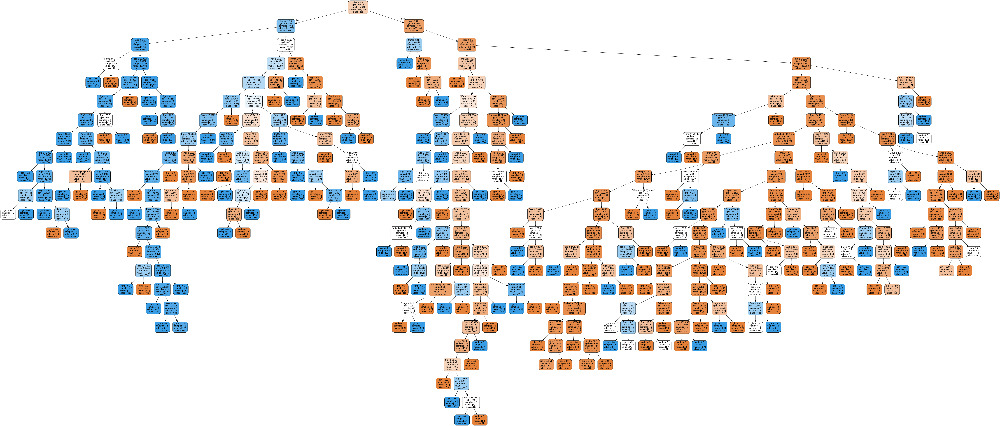

In [116]:
dot_data = StringIO()  
export_graphviz(dtc_titanic, out_file=dot_data,  
                    feature_names=X_train.columns,  
#                    class_names=True,
                    class_names=['No', 'Yes'],                
                    filled=True, rounded=True,  
#                    proportion=True,
#                     node_ids=True,
                    special_characters=True)  
graph_titanic = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph_titanic.write_pdf("titanic_tree.pdf") 
Image(graph_titanic.create_png())  

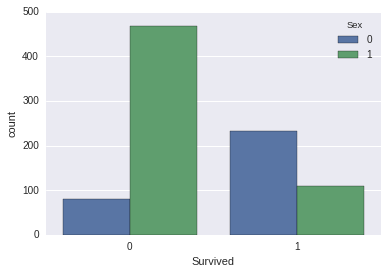

In [111]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

sns.countplot(x='Survived', hue='Sex', data=titanic_tr)
plt.show()